In [1]:
import warnings
warnings.filterwarnings("ignore")
import scanpy as sc
import schist as sh
import pandas as pd
import scipy.stats
import sklearn.metrics
import scipy.spatial
import scipy.cluster

%pylab
%matplotlib inline

Using matplotlib backend: MacOSX
Populating the interactive namespace from numpy and matplotlib


# nSBM hierarchy is consistent with differentiation trajectory

Here we show how nSBM hierarchy fits with known differentiation trajectory in hematopoietic development. We use data from Paul et al. 2015.

Data are retrieved using scanpy and processed as in PAGA how-to

In [2]:
sc.settings.verbosity=2

adata = sh.io.read("paul15_minimize")
adata_raw = sc.datasets.paul15()
sc.pp.log1p(adata_raw)
sc.pp.scale(adata_raw)
adata.raw = adata_raw

... storing 'paul15_clusters' as categorical
Trying to set attribute `.uns` of view, copying.


In [3]:
sc.tl.diffmap(adata)
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=30, use_rep='X_diffmap')

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9945764  0.97498155 0.9732659  0.95849717 0.9478831
     0.92134815 0.9171605  0.907743   0.89569426 0.8852633  0.86746824
     0.8538874  0.85078573 0.84663755]
    finished (0:00:00)
computing neighbors
    finished (0:00:04)


In [4]:
sh.inference.nested_model(adata, use_weights=False, n_init=3)

minimizing the nested Stochastic Block Model
    done (0:20:36)
    calculating cell affinity to groups
    finished (0:21:11)


Dump data

In [5]:
sh.io.write(adata, 'paul15')
adata = sh.io.read('paul15')

We define the root of differentiation in the 7MEP cluster

In [6]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['paul15_clusters'] == '7MEP')[0]

In [7]:
sc.tl.dpt(adata)

computing Diffusion Pseudotime using n_dcs=10
    finished (0:00:00)


Also, we calculate leiden clusters at increasing resolutions

In [8]:
res_thr = np.linspace(1, .1, 10)
for x in res_thr:
    sc.tl.leiden(adata, resolution=x, key_added=f'leiden_r_{x:.1f}')

running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)
running Leiden clustering
    finished (0:00:00)


Build the PAGA tree

running PAGA
    finished (0:00:00)


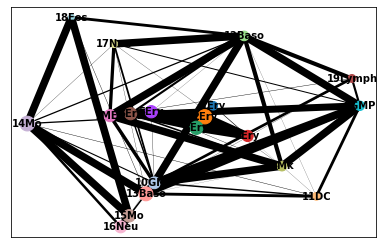

In [9]:
sc.tl.paga(adata, groups='paul15_clusters')

sc.pl.paga(adata, color=['paul15_clusters'], layout='rt_circular')

In [10]:
sc.tl.draw_graph(adata, init_pos='paga')

drawing single-cell graph using layout 'fa'
    finished (0:00:16)


In [11]:
sc.set_figure_params(dpi_save=300, dpi=100)

Visualize results

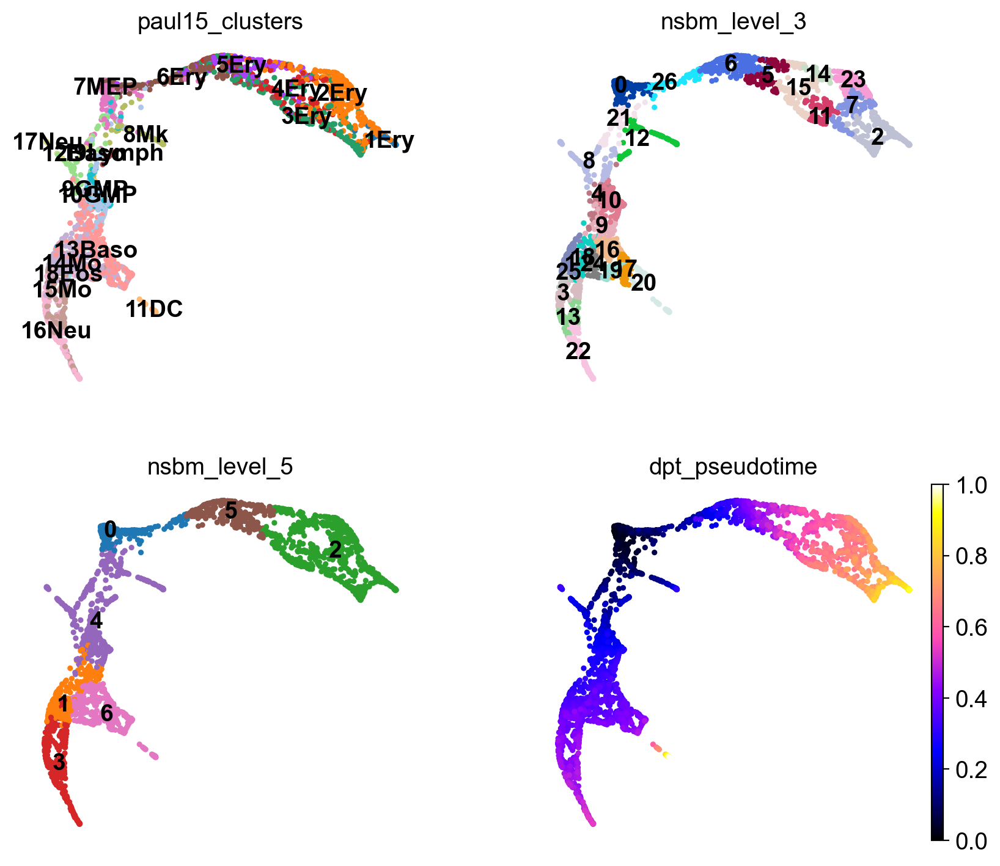

In [12]:
sc.pl.draw_graph(adata, color=['paul15_clusters', 'nsbm_level_3', 
                               'nsbm_level_5', 'dpt_pseudotime'], 
                 legend_loc='on data', ncols=2, frameon=False, color_map='gnuplot2')

Draw hierarchy trees at different levels

Text(0.5, 1.0, '')

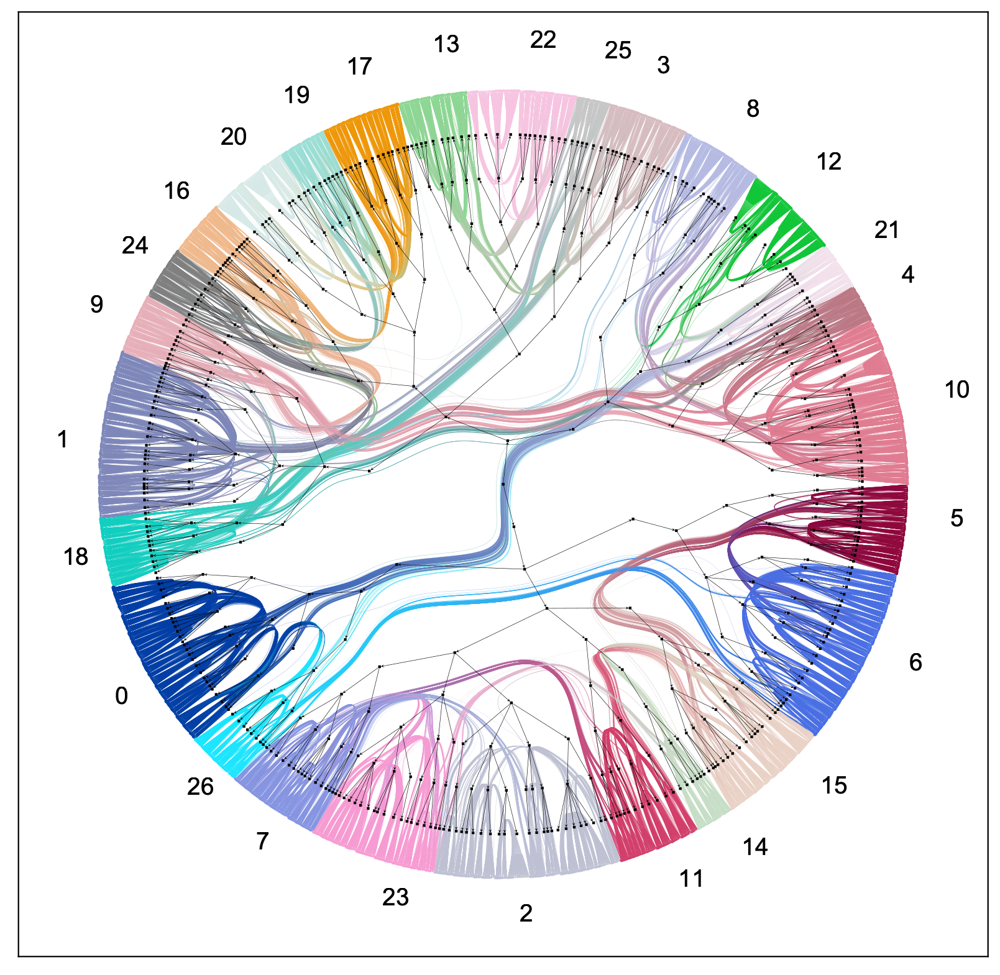

In [13]:
sh.pl.draw_tree(adata,level=3, )
title('')
#savefig('figures/tree_level_3.png', dpi=300)

Text(0.5, 1.0, '')

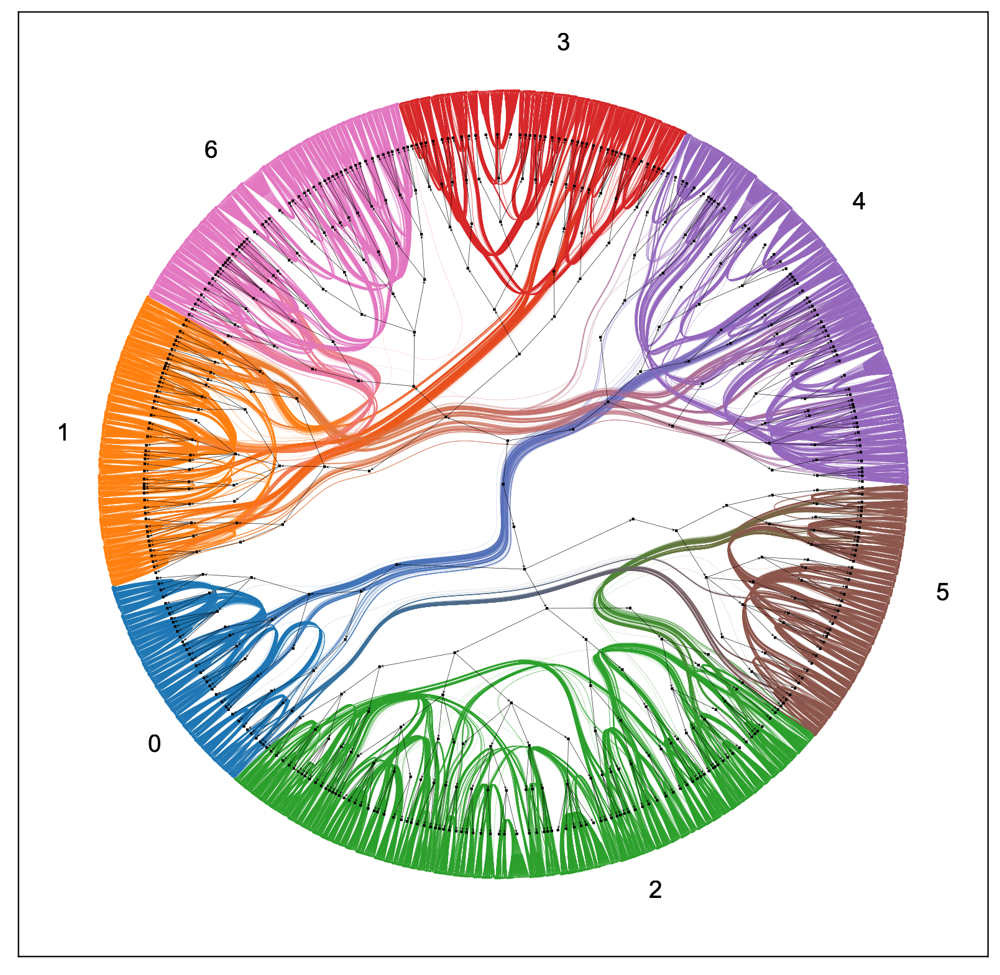

In [14]:
sh.pl.draw_tree(adata,level=5)
title('')
#savefig('figures/tree_level_5.png', dpi=300)

Look at pseudotime, how is in the embedding and on the tree

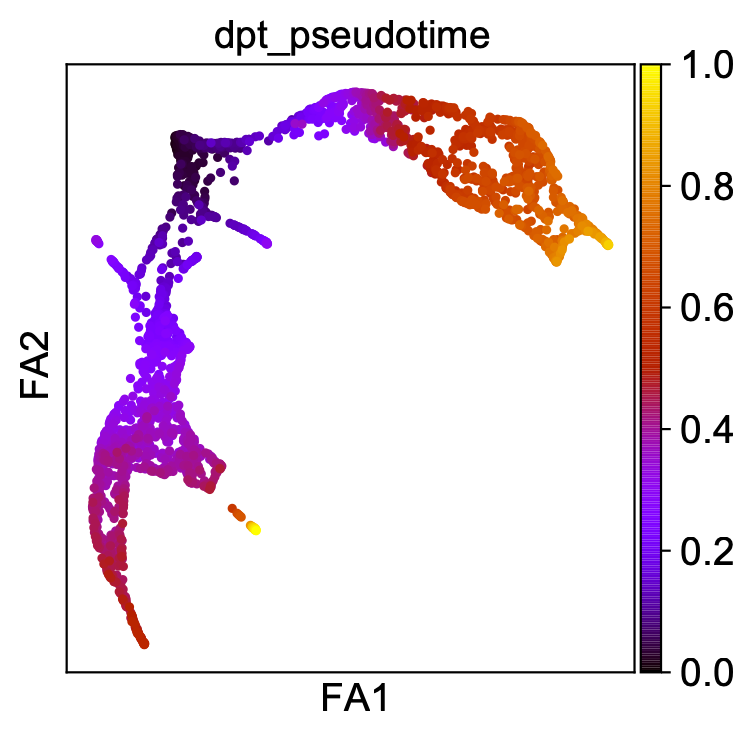

In [15]:
sc.pl.draw_graph(adata, color='dpt_pseudotime', color_map='gnuplot')

Text(0.5, 1.0, '')

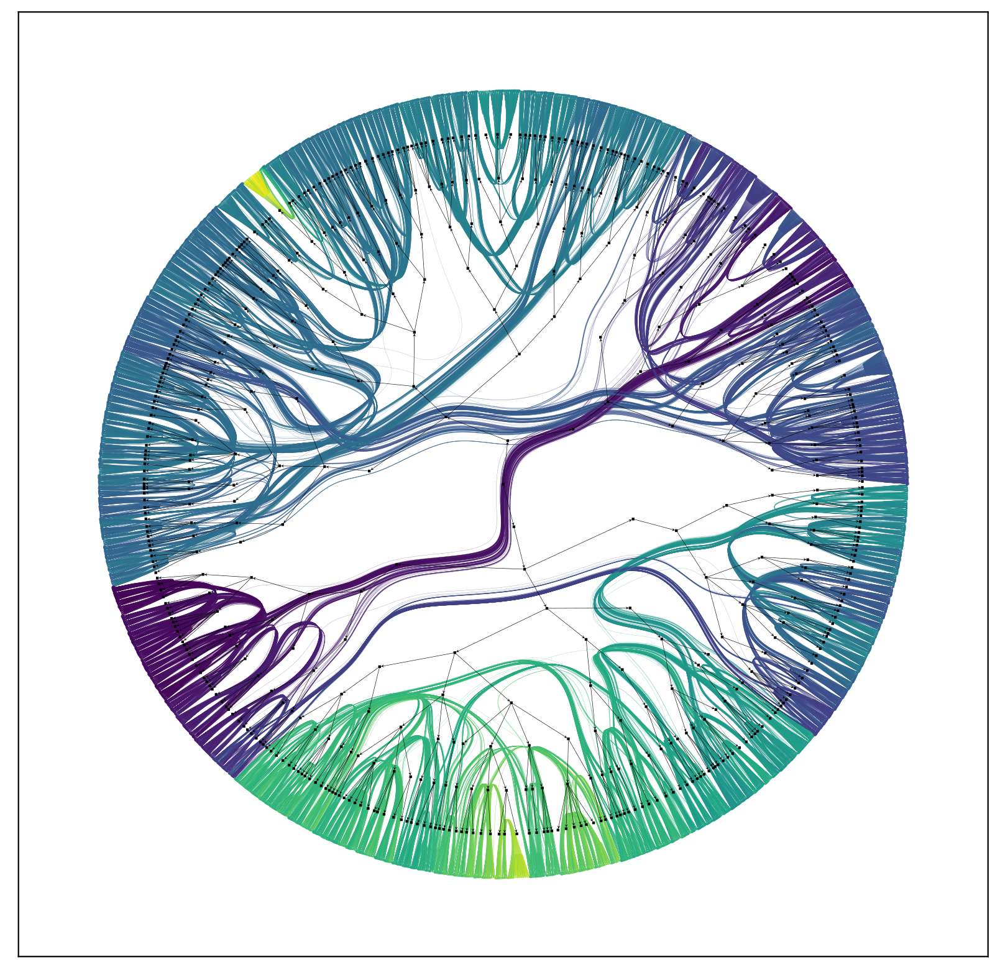

In [16]:
sh.pl.draw_tree(adata, color='dpt_pseudotime')
title('')
#savefig('figures/tree_dpt.png', dpi=300)

Calculate signatures for the 3 main lieages, using known markers, then visualize

In [17]:
signatures = {
'Erythroids':['Gata1', 'Klf1', 'Epor', 'Gypa', 'Hba-a2', 'Hba-a1', 'Spi1'],
'Neutrophils':['Elane', 'Cebpe', 'Ctsg', 'Mpo', 'Gfi1'],
'Monocytes':['Irf8', 'Csf1r', 'Ctsg', 'Mpo'],
}

In [18]:
for s in signatures:
    sc.tl.score_genes(adata, gene_list=signatures[s], score_name=s)

computing score 'Erythroids'
    finished (0:00:00)
computing score 'Neutrophils'
    finished (0:00:00)
computing score 'Monocytes'
    finished (0:00:00)


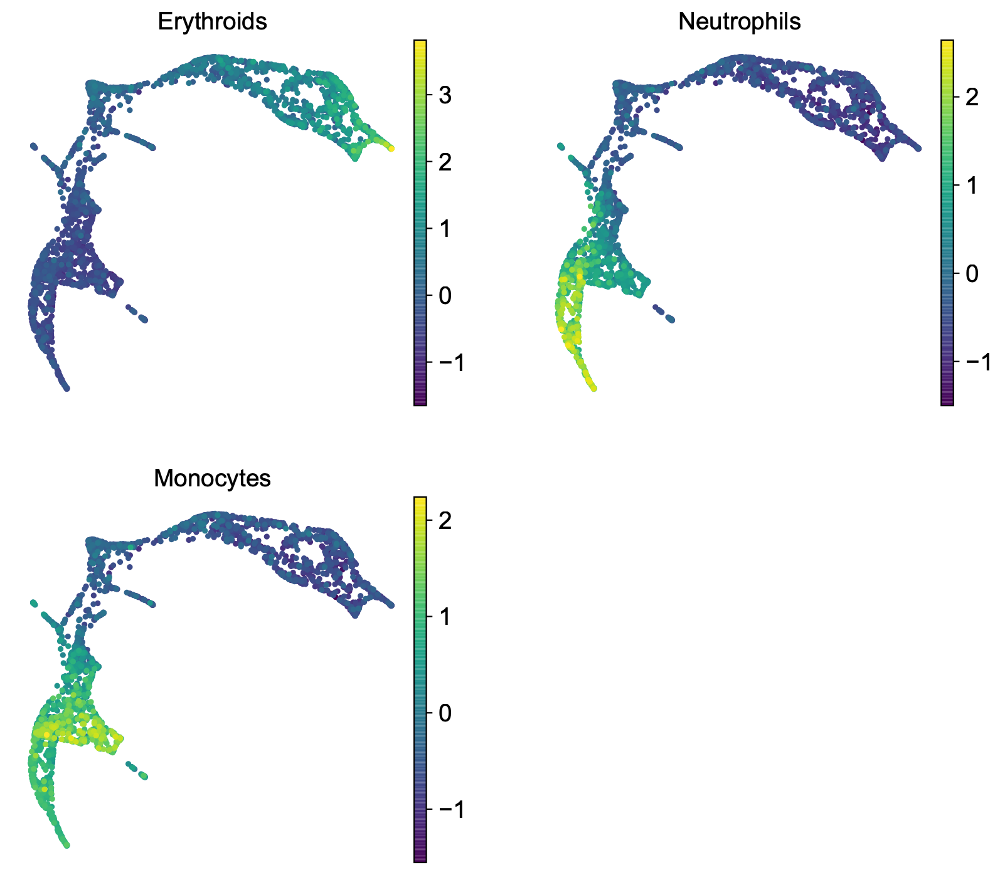

In [19]:
sc.pl.draw_graph(adata, color=['Erythroids', 'Neutrophils', 'Monocytes'], 
                 legend_loc='on data', ncols=2, frameon=False)

Text(0.5, 1.0, '')

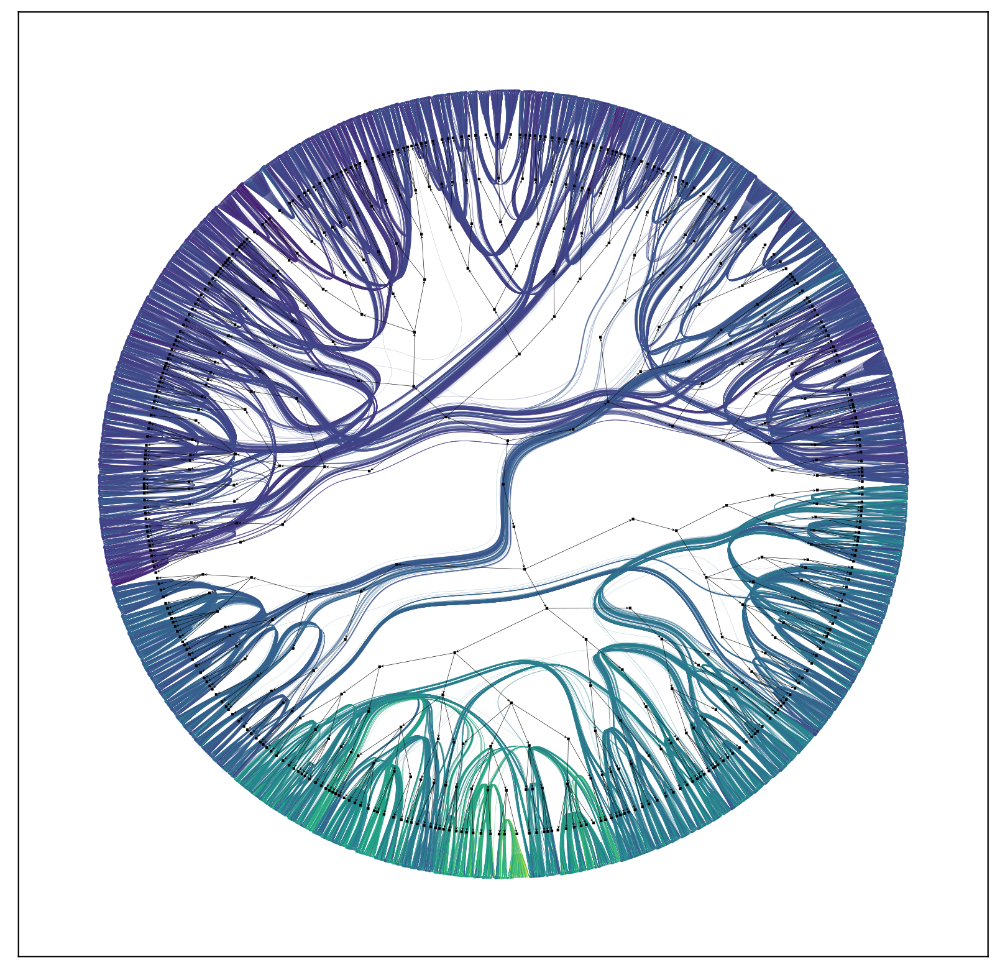

In [20]:
sh.pl.draw_tree(adata, color='Erythroids')
title('')

Text(0.5, 1.0, '')

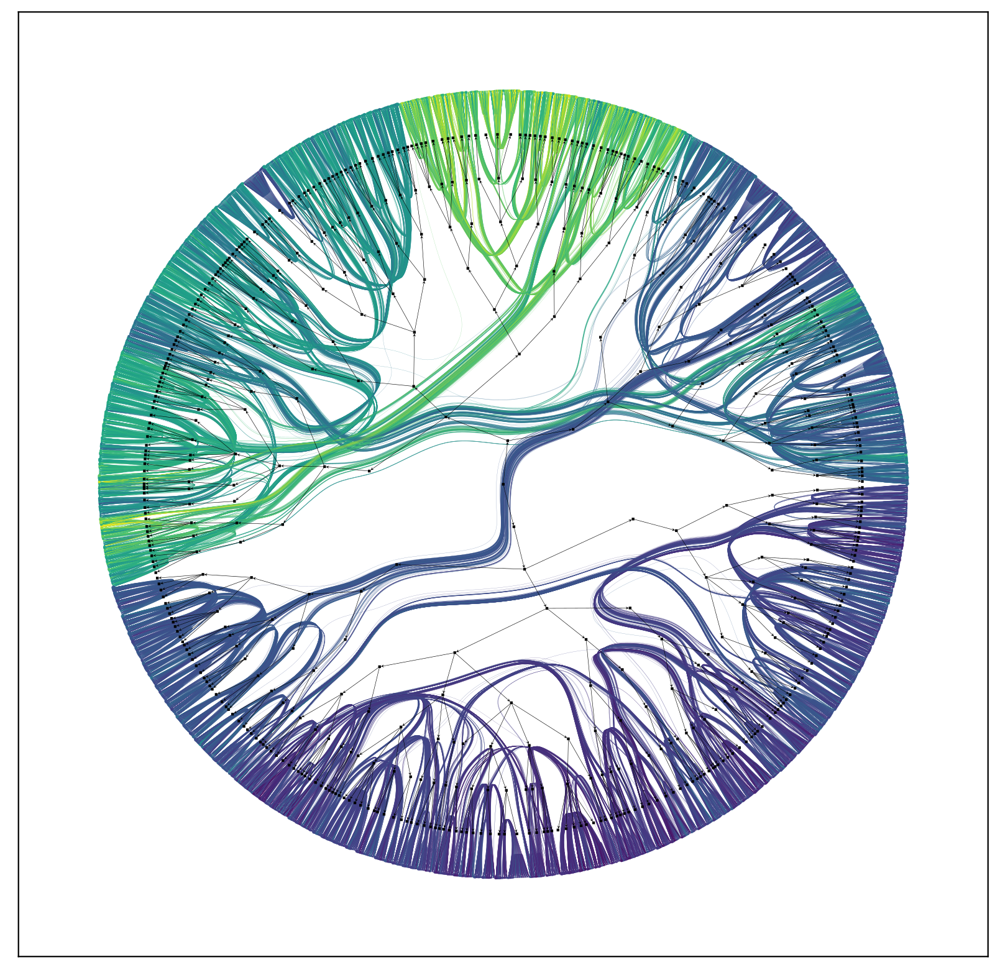

In [21]:
sh.pl.draw_tree(adata, color='Neutrophils')
title('')

Text(0.5, 1.0, '')

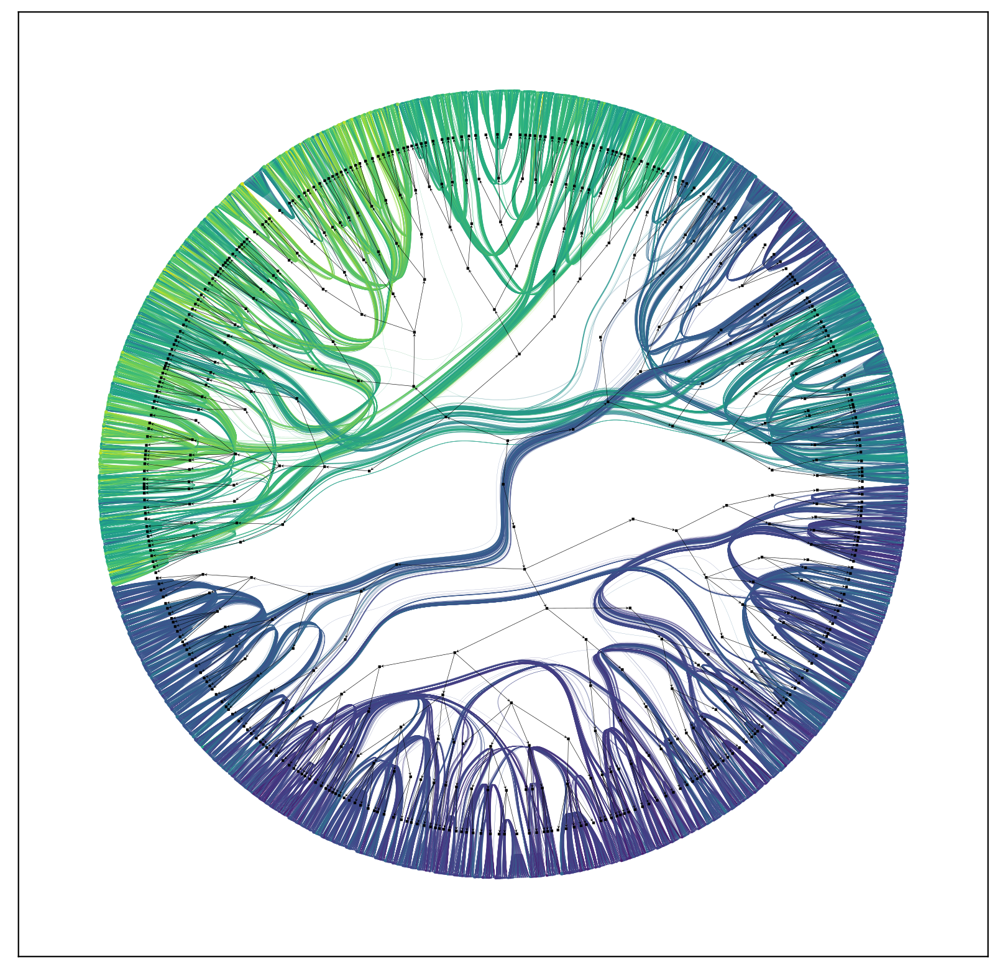

In [22]:
sh.pl.draw_tree(adata, color='Monocytes')
title('')


Also, visualize all Leiden clusterings

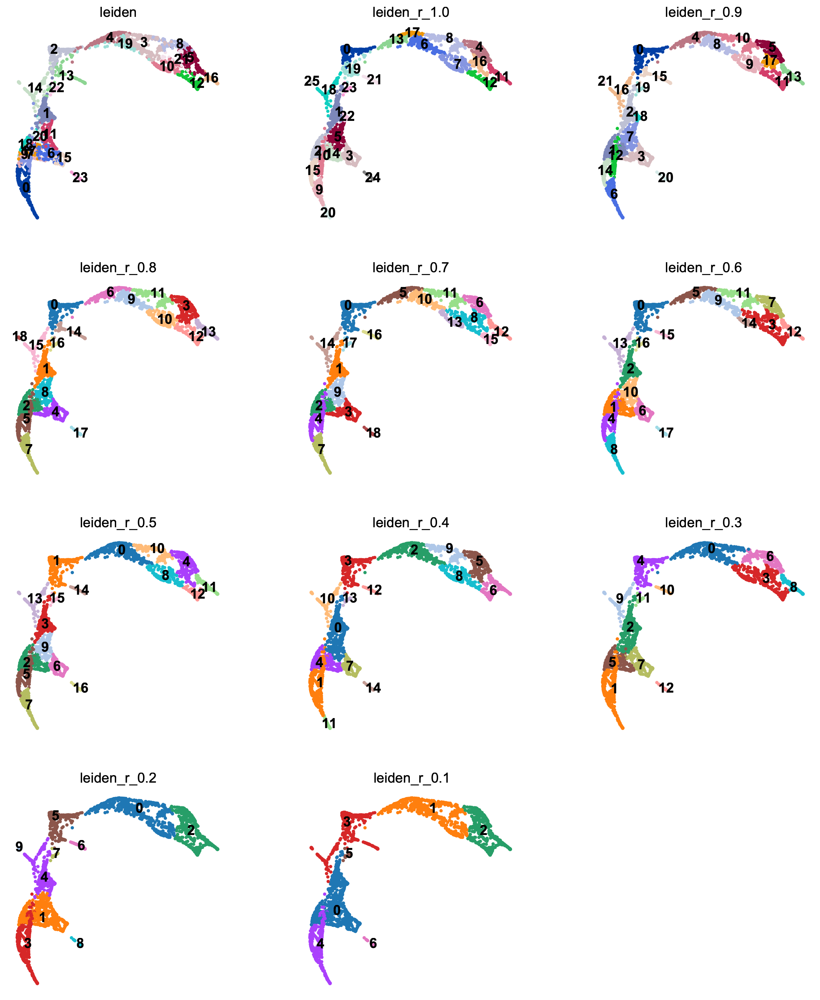

In [23]:
sc.pl.draw_graph(adata, color=[x for x in adata.obs_keys() if x.startswith('leiden')], 
                 legend_loc='on data', ncols=3, frameon=False, color_map='gnuplot2')